<a href="https://colab.research.google.com/github/cggdonner/Government720/blob/main/G720_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Government720 Synthetic Data Generation Using GAN
This is to extrapolate the data from the previous notebook.

### CLIENT 1

In [26]:
# Import pandas
import pandas as pd

# Access Google Drive for Excel file
from google.colab import drive
drive.mount('/content/drive')

# IN CASE OF GENERATING GAN DATA FOR WHOLE SERIES
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT1_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
   UNEMPLOYMENT_RATE  INFLATION_RATE        GDP  HOUSING_AFFORD  MIN_WAGE  \
0                NaN        2.700000  10.000000             NaN      5.15   
1                NaN        2.817597  10.009615             NaN      5.15   
2                NaN        2.942758  10.019231             NaN      5.15   
3                NaN        3.071540  10.028846             NaN      5.15   
4                NaN        3.200000  10.038462             NaN      5.15   

   POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  SS_RECIPIENTS  ...  \
0      8.400000   22.700000   19.200000      NaN   4.541470e+07  ...   
1      8.405275   22.702733   19.243111      NaN   4.542261e+07  ...   
2      8.410523   22.705164   19.285909      NaN   4.543054e+07  ...   
3      8.415744   22.707295   19.328403      NaN   4.543848e+07  ...   
4      8.420937   22.709130   19.370601      NaN

In [27]:
# Extrapolate the following variables linearly **since these variables continuously increase
from sklearn.linear_model import LinearRegression
import numpy as np

# Function for extrapolation
def extrapolate_tail_linear_regression(df, column, n_tail):
    """ Extrapolates missing values at the end of a column using LinearRegression. """
    df = df.copy()
    x = np.arange(len(df)).reshape(-1, 1)  # Convert index to 2D array for sklearn
    mask = df[column].notna()  # Mask for known (non-NaN) values

    if sum(mask) < n_tail:  # Ensure enough points for extrapolation
        raise ValueError("Not enough non-NaN values to extrapolate.")

    # Use the last `n_tail` known points
    x_known = x[mask][-n_tail:]
    y_known = df[column].dropna().values[-n_tail:]

    # Fit Linear Regression Model
    model = LinearRegression()
    model.fit(x_known, y_known)

    # Predict missing values
    missing_mask = df[column].isna()
    df.loc[missing_mask, column] = model.predict(x[missing_mask])

    return df # Return dataframe

# Apply extrapolation with tail window of 52 data points (1 year)
df = extrapolate_tail_linear_regression(df, 'GDP', n_tail=52)
df = extrapolate_tail_linear_regression(df, 'MIN_WAGE', n_tail=52)
df = extrapolate_tail_linear_regression(df, 'POVERTY_WAGE', n_tail=52)
df = extrapolate_tail_linear_regression(df, 'SS_RECIPIENTS', n_tail=52)
df = extrapolate_tail_linear_regression(df, 'CHILDCARE_COST', n_tail=52)
print(df)

      UNEMPLOYMENT_RATE  INFLATION_RATE        GDP  HOUSING_AFFORD  MIN_WAGE  \
0                   NaN        2.700000  10.000000             NaN      5.15   
1                   NaN        2.817597  10.009615             NaN      5.15   
2                   NaN        2.942758  10.019231             NaN      5.15   
3                   NaN        3.071540  10.028846             NaN      5.15   
4                   NaN        3.200000  10.038462             NaN      5.15   
...                 ...             ...        ...             ...       ...   
1295              4.100        2.900000  27.973743             NaN      7.25   
1296              4.075             NaN  27.992788             NaN      7.25   
1297              4.050             NaN  28.011834             NaN      7.25   
1298              4.025             NaN  28.030880             NaN      7.25   
1299              4.000             NaN  28.049926             NaN      7.25   

      POVERTY_WAGE  GENDER_GAP  RACIAL_

In [28]:
# Print how many missing values are still in the data
print(df.isnull().sum())

UNEMPLOYMENT_RATE        255
INFLATION_RATE             4
GDP                        0
HOUSING_AFFORD           415
MIN_WAGE                   0
POVERTY_WAGE               0
GENDER_GAP                51
RACIAL_GAP                51
DEFICIT                  155
SS_RECIPIENTS              0
CPI                        8
MEDIAN_WAGE              155
MANU_JOBS                181
UNION_MEMBERS            103
JOBS_ADDED                 0
POVERTY_RATE             207
FED_EMPLOY                 8
GAO_HIGH_RISK             51
INCOME_TAX               155
PAYROLL_TAX              155
CORPORATE_TAX            155
CORPORATE_PROFIT          77
TOP1_WEALTH              103
FICO_SCORE               389
UNEMPLOY_PER_JOB_OPEN    519
LABOR_PART_RATE          259
LAYOFF_RATE               59
CHILDCARE_COST             0
TEACHER_PAY              727
dtype: int64


In [29]:
# Import packages
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [30]:
# Import packages for model architecture
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout

# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [31]:
# Training using tensorflow
import numpy as np
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999344348907471
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


In [33]:
# Gaussian filtering package
from scipy.ndimage import gaussian_filter

# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


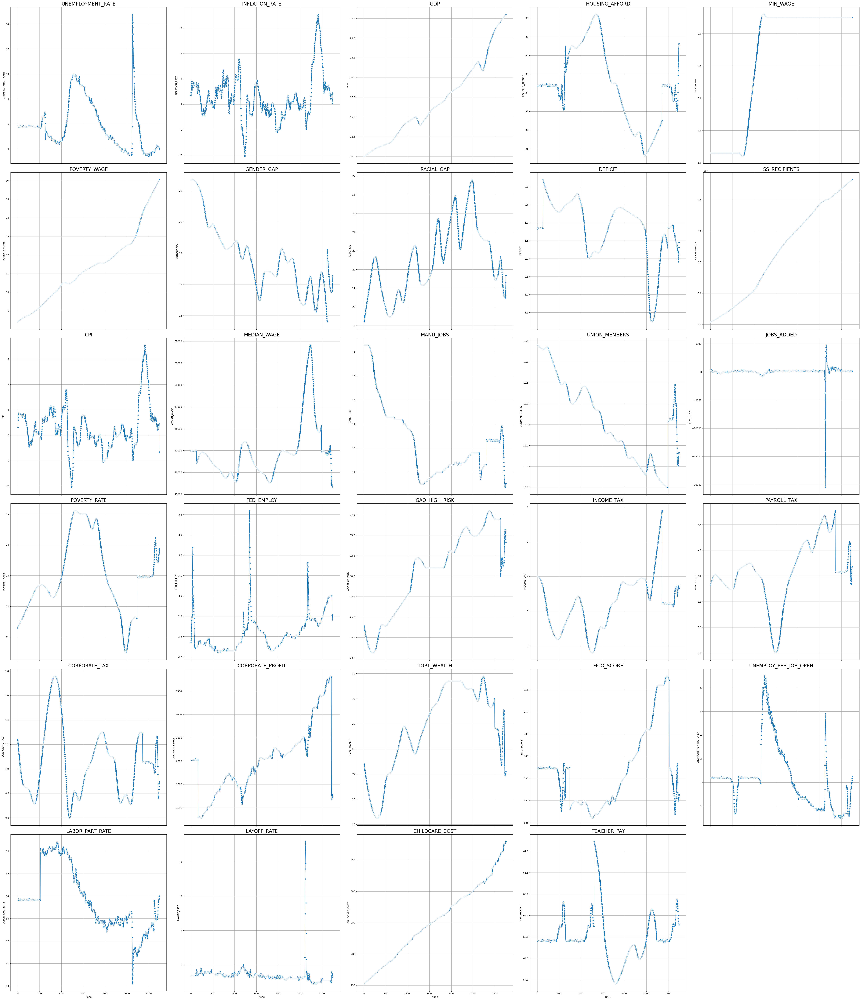

In [34]:
# Make multi-graph chart of numeric time series variables to verify GAN data generation is good
# Import packages
import seaborn as sns
import matplotlib.pyplot as plt

# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [35]:
# Verify that there are no missing values
df_filled.isna().values.any()

False

In [36]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT1_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT1_GAN.xlsx


### CLIENT 2

In [37]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT2_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
0    55.000000      0.000000            0.0     0.000000            NaN   
1    54.865717      0.108169            0.0     0.031225            NaN   
2    54.732159      0.216330            0.0     0.062399            NaN   
3    54.599418      0.324482            0.0     0.093523            NaN   
4    54.467586      0.432625            0.0     0.124597            NaN   

   MISINFORMATION_MENTIONS  
0                      NaN  
1                      NaN  
2                      NaN  
3                      NaN  
4                      NaN  


In [38]:
# Print how many missing values are still in the data
print(df.isnull().sum())

MEDIA_TRUST                  0
FACEBOOK_USE               103
INSTAGRAM_USE              103
TWITTER_USE                103
FACT_CHECKERS              883
MISINFORMATION_MENTIONS    792
dtype: int64


In [39]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [40]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [41]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9998428225517273
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


In [42]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


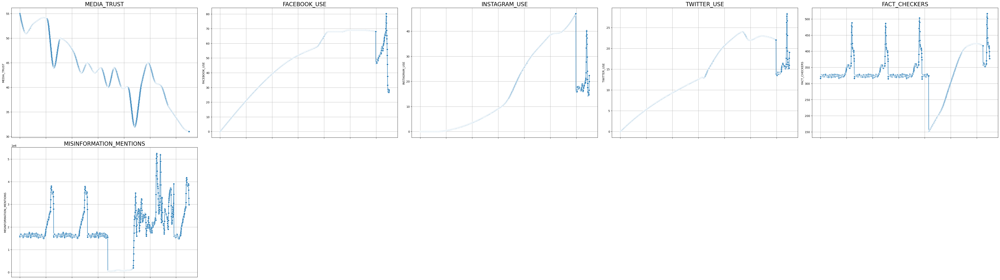

In [43]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [44]:
# Verify that there are no missing values
df_filled.isna().values.any()

False

In [45]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT2_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT2_GAN.xlsx


### CLIENT 3

In [53]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT3_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE    SUICIDE  \
0       10.300000             6.100000         86.900000  10.400000   
1       10.296179             6.097229         86.892308  10.406703   
2       10.292408             6.094683         86.884615  10.413352   
3       10.288690             6.092359         86.876923  10.419947   
4       10.285025             6.090256         86.869231  10.426491   

   OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0           NaN        NaN                  NaN    8407.000000   
1           NaN        NaN                  NaN    8415.358725   
2           NaN        NaN                  NaN    8424.222883   
3           NaN        NaN                  NaN    8433.591756   
4           NaN        NaN                  NaN    8443.464627   

   OPIOID_PRESCRIP  FENTANYL_DEATHS  ALCOHOL_TREATMENT  OPIOID_TREATMENT  \
0              NaN       782.000000                NaN               NaN   
1              NaN      

In [54]:
# Function for extrapolation for tail values (increasing/decreasing)
def extrapolate_tail_linear_regression(df, column, n_tail):
    """ Extrapolates missing values at the end of a column using LinearRegression. """
    df = df.copy()
    x = np.arange(len(df)).reshape(-1, 1)  # Convert index to 2D array for sklearn
    mask = df[column].notna()  # Mask for known (non-NaN) values

    if sum(mask) < n_tail:  # Ensure enough points for extrapolation
        raise ValueError("Not enough non-NaN values to extrapolate.")

    # Use the last `n_tail` known points
    x_known = x[mask][-n_tail:]
    y_known = df[column].dropna().values[-n_tail:]

    # Fit Linear Regression Model
    model = LinearRegression()
    model.fit(x_known, y_known)

    # Predict missing values
    missing_mask = df[column].isna()
    df.loc[missing_mask, column] = model.predict(x[missing_mask])

    return df # Return dataframe

# Apply extrapolation with tail window of 52 data points (1 year)
df = extrapolate_tail_linear_regression(df, 'OVERDOSE_DEATH_RATE', n_tail=52)
df = extrapolate_tail_linear_regression(df, 'OPIOID_DEATHS', n_tail=52)
df = extrapolate_tail_linear_regression(df, 'FENTANYL_DEATHS', n_tail=52)
df = extrapolate_tail_linear_regression(df, 'CANCER_MORTALITY', n_tail=52)
print(df)

      GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE    SUICIDE  \
0          10.300000             6.100000         86.900000  10.400000   
1          10.296179             6.097229         86.892308  10.406703   
2          10.292408             6.094683         86.884615  10.413352   
3          10.288690             6.092359         86.876923  10.419947   
4          10.285025             6.090256         86.869231  10.426491   
...              ...                  ...               ...        ...   
1244       13.830769            33.028634               NaN        NaN   
1245       13.823077            33.030938               NaN        NaN   
1246       13.815385            33.033242               NaN        NaN   
1247       13.807692            33.035546               NaN        NaN   
1248       13.800000            33.037850               NaN        NaN   

      OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0              NaN        NaN             

In [55]:
# Print how many missing values are still in the data
print(df.isnull().sum())

GUN_DEATH_RATE           0
OVERDOSE_DEATH_RATE      0
HEALTH_INSURANCE       104
SUICIDE                104
OBESITY_RATE           312
ABORTIONS              780
MENTAL_ILLNESS_RATE    572
OPIOID_DEATHS            0
OPIOID_PRESCRIP        416
FENTANYL_DEATHS          0
ALCOHOL_TREATMENT      416
OPIOID_TREATMENT       416
IVF_BABIES             780
VACC_IMPORTANCE         52
DIABETES_RATE          364
CANCER_SURVIVAL        416
CANCER_INCIDENCE       156
CANCER_MORTALITY         0
HEART_DISEASE          260
FDA_APPROVALS          104
dtype: int64


In [56]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [57]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [58]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9998378753662109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

In [59]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


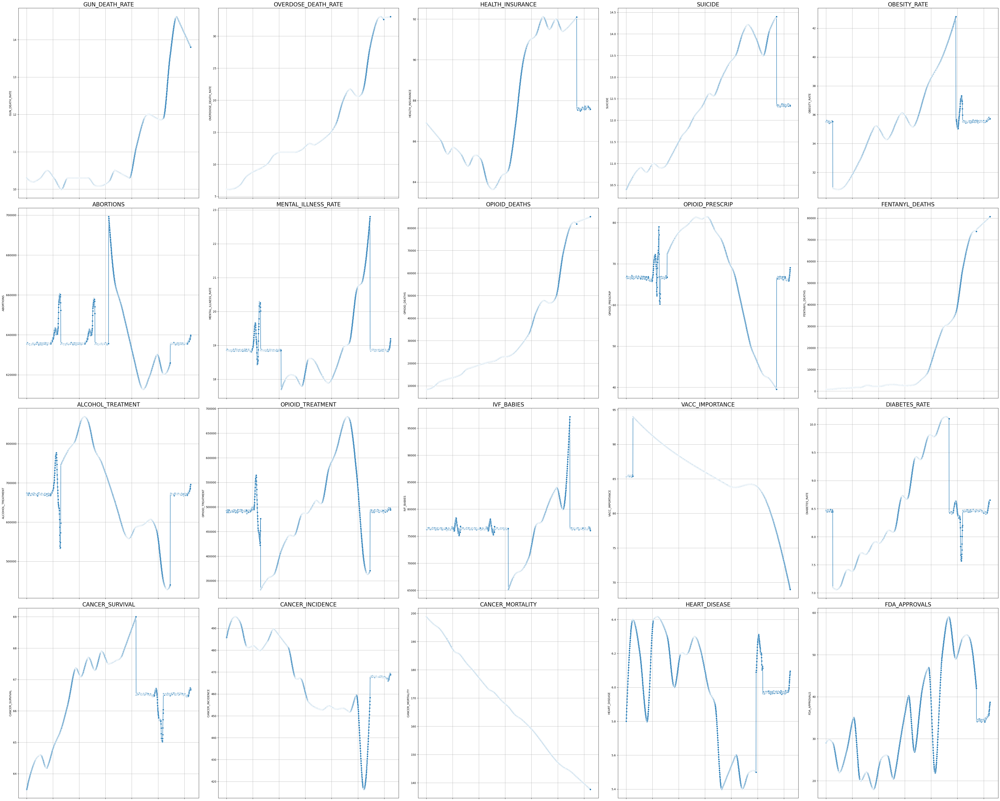

In [60]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [61]:
# Verify that there are no missing values
df_filled.isna().values.any()

False

In [62]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT3_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT3_GAN.xlsx


### CLIENT 4

In [86]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT4_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0   11.210000      53.000000                     NaN              NaN   
1   11.098395      52.425536                     NaN              NaN   
2   10.987052      51.856147                     NaN              NaN   
3   10.875989      51.292064                     NaN              NaN   
4   10.765222      50.733521                     NaN              NaN   

   ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  PARTISAN_GAP_SENATE  \
0            NaN               NaN                 NaN                  NaN   
1            NaN               NaN                 NaN                  NaN   
2            NaN               NaN                 NaN                  NaN   
3            NaN               NaN                 NaN                  NaN   
4            NaN               NaN                 NaN                  NaN   

   HOUSE_LEANING  SENATE_LEANING  
0            NaN             NaN  
1            NaN

In [87]:
# Function to extrapolate head and tail
def extrapolate_head_tail_linear_regression(df, column, n_points):
    df = df.copy()
    x = np.arange(len(df)).reshape(-1, 1)  # Convert index to 2D array for sklearn
    mask = df[column].notna()  # Mask for known (non-NaN) values

    if sum(mask) < n_points:  # Ensure enough points for extrapolation
        raise ValueError("Not enough non-NaN values to extrapolate.")

    # ---- HEAD EXTRAPOLATION ----
    # Use the first `n_points` known points
    x_known_head = x[mask][:n_points]
    y_known_head = df[column].dropna().values[:n_points]

    model_head = LinearRegression()
    model_head.fit(x_known_head, y_known_head)

    # Predict missing values at the beginning
    first_valid_index = df[column].first_valid_index()
    missing_head_mask = df.index < first_valid_index
    df.loc[missing_head_mask, column] = model_head.predict(x[missing_head_mask])

    # ---- TAIL EXTRAPOLATION ----
    # Use the last `n_points` known points
    x_known_tail = x[mask][-n_points:]
    y_known_tail = df[column].dropna().values[-n_points:]

    model_tail = LinearRegression()
    model_tail.fit(x_known_tail, y_known_tail)

    # Predict missing values at the end
    last_valid_index = df[column].last_valid_index()
    missing_tail_mask = df.index > last_valid_index
    df.loc[missing_tail_mask, column] = model_tail.predict(x[missing_tail_mask])

    return df  # Return dataframe

# Apply extrapolation with head window of 52 data points (1 year)
df = extrapolate_head_tail_linear_regression(df, 'PARTISAN_GAP_SENATE', n_points=52)
print(df)

      DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0      11.210000      53.000000                     NaN              NaN   
1      11.098395      52.425536                     NaN              NaN   
2      10.987052      51.856147                     NaN              NaN   
3      10.875989      51.292064                     NaN              NaN   
4      10.765222      50.733521                     NaN              NaN   
...          ...            ...                     ...              ...   
1295         NaN            NaN                     NaN       270.161236   
1296         NaN            NaN                     NaN       269.134039   
1297         NaN            NaN                     NaN       268.098130   
1298         NaN            NaN                     NaN       267.053465   
1299         NaN            NaN                     NaN       266.000000   

      ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  \
0               NaN       

In [88]:
# Print how many missing values are still in the data
print(df.isnull().sum())

DARK_MONEY                 51
VOTER_TURNOUT             155
SUPREME_COURT_APPROVAL     47
CLOTURE_MOTIONS            52
ENACTED_LEGIS              52
OFFICIAL_THREATS          831
PARTISAN_GAP_HOUSE        259
PARTISAN_GAP_SENATE         0
HOUSE_LEANING             155
SENATE_LEANING            155
dtype: int64


In [89]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [90]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [91]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999867677688599
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


In [92]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


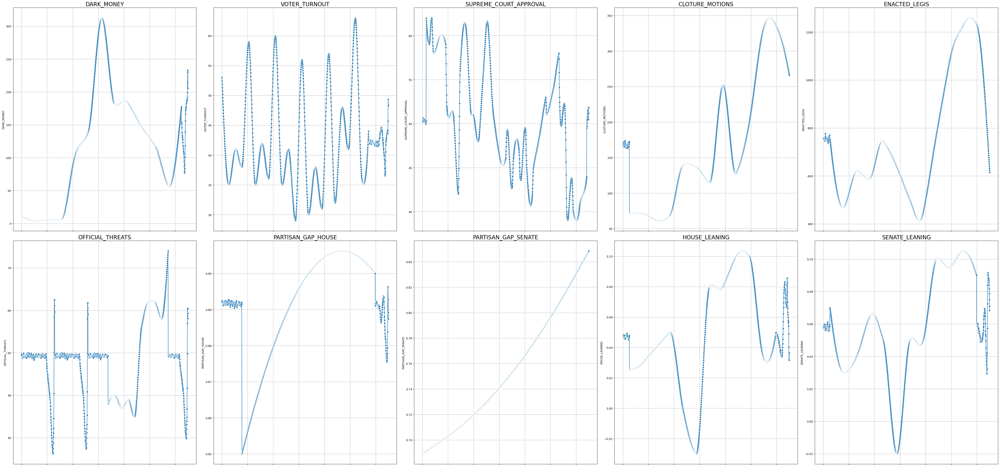

In [93]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [94]:
# Verify that there are no missing values
df_filled.isna().values.any()

False

In [95]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT4_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT4_GAN.xlsx


### CLIENT 5

In [96]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT5_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  READING_PROF  \
0     3349.000000     14616.000000    1.531229e+07        NaN     32.500000   
1     3351.149310     14633.487606    1.532350e+07        NaN     32.516760   
2     3353.328048     14650.931280    1.533475e+07        NaN     32.533386   
3     3355.536267     14668.331153    1.534604e+07        NaN     32.549874   
4     3357.774023     14685.687356    1.535737e+07        NaN     32.566221   

   MATH_PROF  
0  26.000000  
1  26.024008  
2  26.047954  
3  26.071838  
4  26.095661  


In [98]:
# Extrapolate head and tail
def extrapolate_head_tail_linear_regression(df, column, n_points):
    df = df.copy()
    x = np.arange(len(df)).reshape(-1, 1)  # Convert index to 2D array for sklearn
    mask = df[column].notna()  # Mask for known (non-NaN) values

    if sum(mask) < n_points:  # Ensure enough points for extrapolation
        print(f"Skipping {column}: Not enough non-NaN values to extrapolate.")
        return df

    # ---- HEAD EXTRAPOLATION ----
    first_valid_index = df[column].first_valid_index()
    missing_head_mask = df.index < first_valid_index
    if sum(missing_head_mask) > 0:
        x_known_head = x[mask][:n_points]
        y_known_head = df[column].dropna().values[:n_points]

        if len(x_known_head) > 0:
            model_head = LinearRegression()
            model_head.fit(x_known_head, y_known_head)
            df.loc[missing_head_mask, column] = model_head.predict(x[missing_head_mask])

    # ---- TAIL EXTRAPOLATION ----
    last_valid_index = df[column].last_valid_index()
    missing_tail_mask = df.index > last_valid_index
    if sum(missing_tail_mask) > 0:
        x_known_tail = x[mask][-n_points:]
        y_known_tail = df[column].dropna().values[-n_points:]

        if len(x_known_tail) > 0:
            model_tail = LinearRegression()
            model_tail.fit(x_known_tail, y_known_tail)
            df.loc[missing_tail_mask, column] = model_tail.predict(x[missing_tail_mask])

    return df  # Return dataframe

# Apply extrapolation safely
for col in ['PUBLIC_TUITION', 'PRIVATE_TUITION', 'LOAN_DEBT']:
    df = extrapolate_head_tail_linear_regression(df, col, n_points=52)

print(df)

      PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  \
0        3349.000000     14616.000000    1.531229e+07   0.037141   
1        3351.149310     14633.487606    1.532350e+07   0.038462   
2        3353.328048     14650.931280    1.533475e+07   0.039784   
3        3355.536267     14668.331153    1.534604e+07   0.041105   
4        3357.774023     14685.687356    1.535737e+07   0.042427   
...              ...              ...             ...        ...   
1295    10050.250527     37543.857904             NaN   1.764338   
1296    10053.234334     37566.964029             NaN   1.765716   
1297    10056.218141     37590.070155             NaN   1.767119   
1298    10059.201947     37613.176280             NaN   1.768547   
1299    10062.185754     37636.282406             NaN   1.770000   

      READING_PROF  MATH_PROF  
0        32.500000  26.000000  
1        32.516760  26.024008  
2        32.533386  26.047954  
3        32.549874  26.071838  
4        32.566221  26.

In [99]:
# Print how many missing values are still in the data
print(df.isnull().sum())

PUBLIC_TUITION       0
PRIVATE_TUITION      0
COLLEGE_ENROLL      51
LOAN_DEBT            0
READING_PROF       311
MATH_PROF          311
dtype: int64


In [100]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [101]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [102]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999009966850281
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


In [103]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


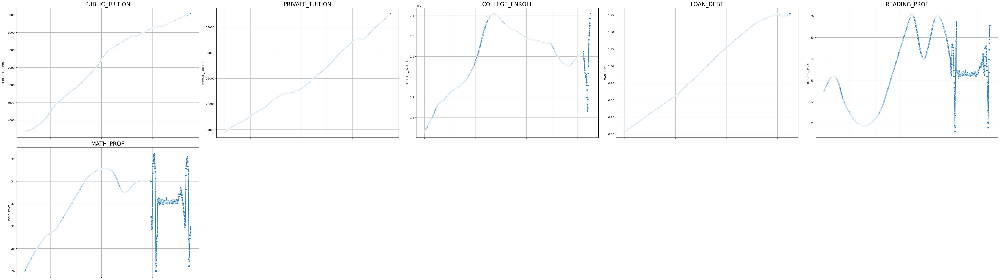

In [105]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [106]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT5_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT5_GAN.xlsx


### CLIENT 6

In [107]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT6_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

    OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0  12.450000    19.340000    4.200000       37.730000       22.910000   
1  12.448176    19.344388    4.202293       37.742754       22.946000   
2  12.446358    19.348895    4.204366       37.755435       22.981306   
3  12.444545    19.353519    4.206221       37.768037       23.015916   
4  12.442738    19.358256    4.207862       37.780552       23.049828   

   RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0       4.200000   7.370000      9350.000000                0.0   
1       4.202674   7.366161      9514.643257                0.0   
2       4.205121   7.362338      9680.962127                0.0   
3       4.207343   7.358533      9848.963339                0.0   
4       4.209345   7.354749     10018.653620                0.0   

   FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0       0.860700           5.000000      1.860000  
1       0.874704           4.913997      1.838543  
2 

In [108]:
# Print how many missing values are still in the data
print(df.isnull().sum())

OIL_PROD               0
NATGAS_PROD            0
RENEW_PROD             0
PETROL_CONSUMP         0
NATGAS_CONSUMP         0
RENEW_CONSUMP          0
EMISSIONS            156
HYBRID_VEHICLES      156
ELECTRIC_VEHICLES    156
FEMA_SPENDING         52
NATURAL_DISASTERS      0
SURFACE_TEMP           0
dtype: int64


In [109]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [110]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [111]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999645352363586
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


In [112]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


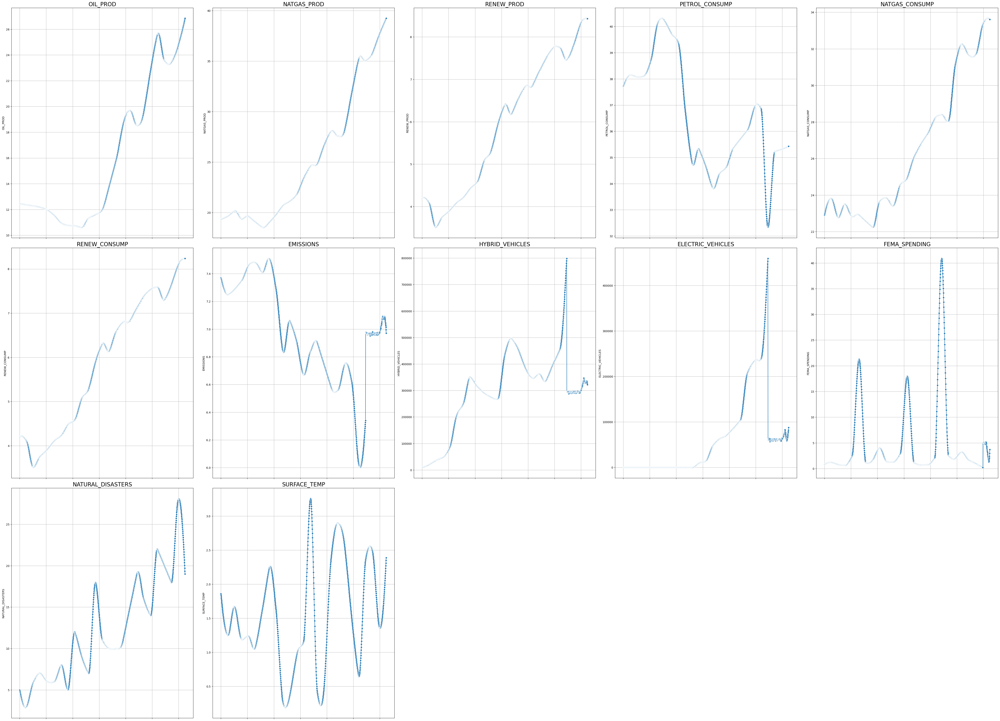

In [113]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 6*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [114]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT6_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT6_GAN.xlsx


### CLIENT 7

In [117]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT7_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0                NaN   3.110789e+07      8.460000e+06         6.900000   
1                NaN   3.111650e+07      8.463841e+06         6.869708   
2                NaN   3.112519e+07      8.467710e+06         6.840563   
3                NaN   3.113397e+07      8.471607e+06         6.812561   
4                NaN   3.114282e+07      8.475532e+06         6.785700   

   DEPORTATIONS  ASYLUM_APPS  
0           NaN          NaN  
1           NaN          NaN  
2           NaN          NaN  
3           NaN          NaN  
4           NaN          NaN  


In [118]:
# Extrapolate head and tail
def extrapolate_head_tail_linear_regression(df, column, n_points):
    df = df.copy()
    x = np.arange(len(df)).reshape(-1, 1)  # Convert index to 2D array for sklearn
    mask = df[column].notna()  # Mask for known (non-NaN) values

    if sum(mask) < n_points:  # Ensure enough points for extrapolation
        print(f"Skipping {column}: Not enough non-NaN values to extrapolate.")
        return df

    # ---- HEAD EXTRAPOLATION ----
    first_valid_index = df[column].first_valid_index()
    missing_head_mask = df.index < first_valid_index
    if sum(missing_head_mask) > 0:
        x_known_head = x[mask][:n_points]
        y_known_head = df[column].dropna().values[:n_points]

        if len(x_known_head) > 0:
            model_head = LinearRegression()
            model_head.fit(x_known_head, y_known_head)
            df.loc[missing_head_mask, column] = model_head.predict(x[missing_head_mask])

    # ---- TAIL EXTRAPOLATION ----
    last_valid_index = df[column].last_valid_index()
    missing_tail_mask = df.index > last_valid_index
    if sum(missing_tail_mask) > 0:
        x_known_tail = x[mask][-n_points:]
        y_known_tail = df[column].dropna().values[-n_points:]

        if len(x_known_tail) > 0:
            model_tail = LinearRegression()
            model_tail.fit(x_known_tail, y_known_tail)
            df.loc[missing_tail_mask, column] = model_tail.predict(x[missing_tail_mask])

    return df  # Return dataframe

# Apply extrapolation safely
for col in ['IMMIGRANT_POP']:
    df = extrapolate_head_tail_linear_regression(df, col, n_points=52)

print(df)

      BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0                   NaN   3.110789e+07      8.460000e+06         6.900000   
1                   NaN   3.111650e+07      8.463841e+06         6.869708   
2                   NaN   3.112519e+07      8.467710e+06         6.840563   
3                   NaN   3.113397e+07      8.471607e+06         6.812561   
4                   NaN   3.114282e+07      8.475532e+06         6.785700   
...                 ...            ...               ...              ...   
1287                NaN   4.874329e+07               NaN              NaN   
1288                NaN   4.876168e+07               NaN              NaN   
1289                NaN   4.878007e+07               NaN              NaN   
1290                NaN   4.879846e+07               NaN              NaN   
1291                NaN   4.881684e+07               NaN              NaN   

      DEPORTATIONS  ASYLUM_APPS  
0              NaN          NaN  
1      

In [119]:
# Print how many missing values are still in the data
print(df.isnull().sum())

BORDER_ENCOUNTERS     43
IMMIGRANT_POP          0
UNDOCUMENTED_POP     355
BORDER_SPENDING       95
DEPORTATIONS         715
ASYLUM_APPS          927
dtype: int64


In [120]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [121]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [122]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 1.0001649856567383
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


In [123]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


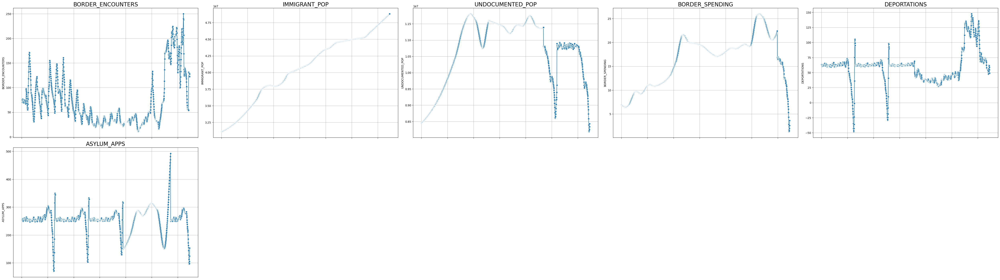

In [125]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [126]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT7_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT7_GAN.xlsx


### CLIENT 8

In [127]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT8_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0             NaN           NaN       65.900000    2.821719e+08  69.400000   
1             NaN           NaN       65.878047    2.822270e+08  69.388462   
2             NaN           NaN       65.856418    2.822821e+08  69.376923   
3             NaN           NaN       65.835108    2.823371e+08  69.365385   
4             NaN           NaN       65.814113    2.823920e+08  69.353846   

   HISPANIC_POP  BLACK_POP  AAPI_POP  CHRISTIAN_POP  NON_RELIGIOUS_POP  
0     12.600000       12.2  3.800000      86.000000           8.000000  
1     12.607692       12.2  3.804807      86.018982           7.981139  
2     12.615385       12.2  3.809613      86.037456           7.963018  
3     12.623077       12.2  3.814413      86.055409           7.945636  
4     12.630769       12.2  3.819208      86.072827           7.928994  


In [128]:
# Extrapolate head and tail
def extrapolate_head_tail_linear_regression(df, column, n_points):
    df = df.copy()
    x = np.arange(len(df)).reshape(-1, 1)  # Convert index to 2D array for sklearn
    mask = df[column].notna()  # Mask for known (non-NaN) values

    if sum(mask) < n_points:  # Ensure enough points for extrapolation
        print(f"Skipping {column}: Not enough non-NaN values to extrapolate.")
        return df

    # ---- HEAD EXTRAPOLATION ----
    first_valid_index = df[column].first_valid_index()
    missing_head_mask = df.index < first_valid_index
    if sum(missing_head_mask) > 0:
        x_known_head = x[mask][:n_points]
        y_known_head = df[column].dropna().values[:n_points]

        if len(x_known_head) > 0:
            model_head = LinearRegression()
            model_head.fit(x_known_head, y_known_head)
            df.loc[missing_head_mask, column] = model_head.predict(x[missing_head_mask])

    # ---- TAIL EXTRAPOLATION ----
    last_valid_index = df[column].last_valid_index()
    missing_tail_mask = df.index > last_valid_index
    if sum(missing_tail_mask) > 0:
        x_known_tail = x[mask][-n_points:]
        y_known_tail = df[column].dropna().values[-n_points:]

        if len(x_known_tail) > 0:
            model_tail = LinearRegression()
            model_tail.fit(x_known_tail, y_known_tail)
            df.loc[missing_tail_mask, column] = model_tail.predict(x[missing_tail_mask])

    return df  # Return dataframe

# Apply extrapolation safely
for col in ['USA_POPULATION','WHITE_POP','HISPANIC_POP','AAPI_POP']:
    df = extrapolate_head_tail_linear_regression(df, col, n_points=52)

print(df)

      LGBTQ_IDENTITY   HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  \
0                NaN            NaN       65.900000    2.821719e+08   
1                NaN            NaN       65.878047    2.822270e+08   
2                NaN            NaN       65.856418    2.822821e+08   
3                NaN            NaN       65.835108    2.823371e+08   
4                NaN            NaN       65.814113    2.823920e+08   
...              ...            ...             ...             ...   
1192        7.559110  645062.160064       54.658456    3.346488e+08   
1193        7.569073  647057.764434       54.619426    3.346755e+08   
1194        7.579206  649063.977088       54.580004    3.347023e+08   
1195        7.589514  651079.741214       54.540194    3.347290e+08   
1196        7.600000  653104.000000       54.500000    3.347557e+08   

      WHITE_POP  HISPANIC_POP  BLACK_POP  AAPI_POP  CHRISTIAN_POP  \
0     69.400000     12.600000       12.2  3.800000      86.000000   
1     69.

In [129]:
# Print how many missing values are still in the data
print(df.isnull().sum())

LGBTQ_IDENTITY       624
HOMELESS_POP         364
FERTILITY_RATE         0
USA_POPULATION         0
WHITE_POP              0
HISPANIC_POP           0
BLACK_POP              0
AAPI_POP               0
CHRISTIAN_POP          0
NON_RELIGIOUS_POP      0
dtype: int64


In [130]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [131]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [132]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999397993087769
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


In [133]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


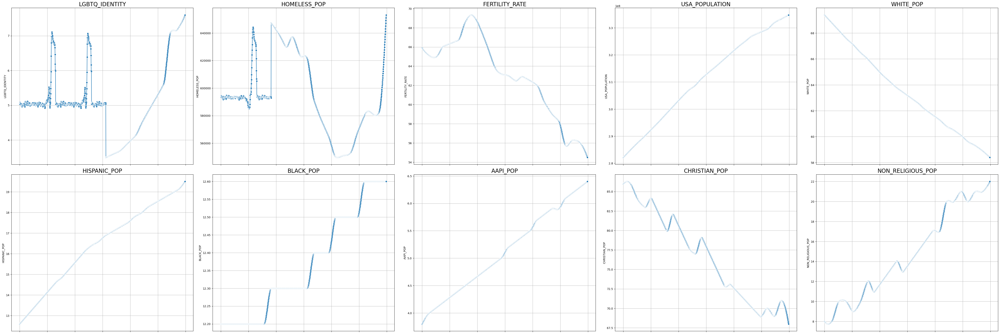

In [135]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 5*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [136]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT8_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT8_GAN.xlsx


### CLIENT 9

In [137]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT9_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0    30.300000   365348.000000                     NaN  832.000000
1    30.175723   365370.123097                     NaN  833.866742
2    30.054791   365396.424258                     NaN  835.736151
3    29.937170   365426.801288                     NaN  837.608154
4    29.822824   365461.151992                     NaN  839.482678


In [138]:
# Print how many missing values are still in the data
print(df.isnull().sum())

FOREIGN_AID                52
MIL_APPLICANTS            156
GLOBAL_INVOLVE_OPINION     52
MIL_DEATHS                 52
dtype: int64


In [139]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [140]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [141]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 1.000117540359497
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1

In [142]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


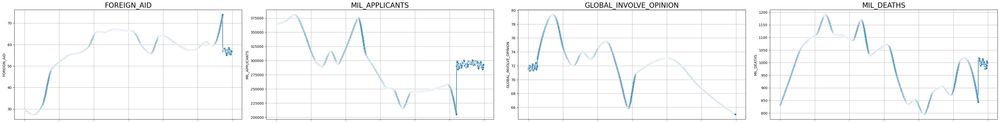

In [144]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [145]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT9_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT9_GAN.xlsx


### CLIENT 10

In [146]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT10_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   GOOD_BRIDGES  UNSATIS_ROADS
0           NaN      17.390000
1           NaN      17.383944
2           NaN      17.377701
3           NaN      17.371277
4           NaN      17.364674


In [147]:
# Print how many missing values are still in the data
print(df.isnull().sum())

GOOD_BRIDGES     624
UNSATIS_ROADS    156
dtype: int64


In [148]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [149]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [150]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999649524688721
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


In [151]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


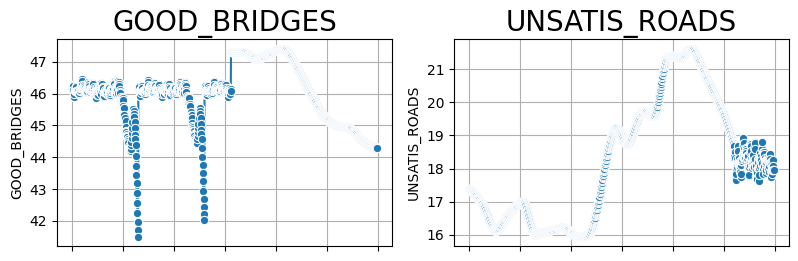

In [153]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [154]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT10_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT10_GAN.xlsx


### CLIENT 11

In [155]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT11_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0         0.000000       8.543037e+06  3.793541e+06                NaN   
1         0.190743       8.557898e+06  3.764666e+06                NaN   
2         0.378364       8.572529e+06  3.736068e+06                NaN   
3         0.562871       8.586926e+06  3.707759e+06                NaN   
4         0.744277       8.601084e+06  3.679751e+06                NaN   

   INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0        494.000000       5.900000                   NaN   
1        493.895079       5.943974                   NaN   
2        493.791918       5.987421                   NaN   
3        493.690613       6.030325                   NaN   
4        493.591261       6.072667                   NaN   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0                    NaN                 NaN              NaN   
1                    NaN                 NaN              NaN   

In [156]:
# Print how many missing values are still in the data
print(df.isnull().sum())

ACTIVE_SHOOTERS          260
BACKGROUND_CHECKS        104
FIREARM_PROD             208
DOM_VIOLENCE_RATE        728
INCARCERATED_POP         104
HOMICIDE_RATE             52
DOM_TERROR_INCIDENTS     624
DOM_TERROR_DEFENDANTS    676
FBI_INVESTIGATIONS       780
FBI_DISRUPTIONS          780
CRIM_JUSTICE_OPINION     156
CYBERATTACKS             988
CYBERATTACK_LOSSES       988
ANTIGOV_HATE_GROUPS        0
BLACK_POLICE_KILLINGS     52
BLACK_POLICE_INJURIES    416
dtype: int64


In [157]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [158]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [159]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 1.000048041343689
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1

In [160]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


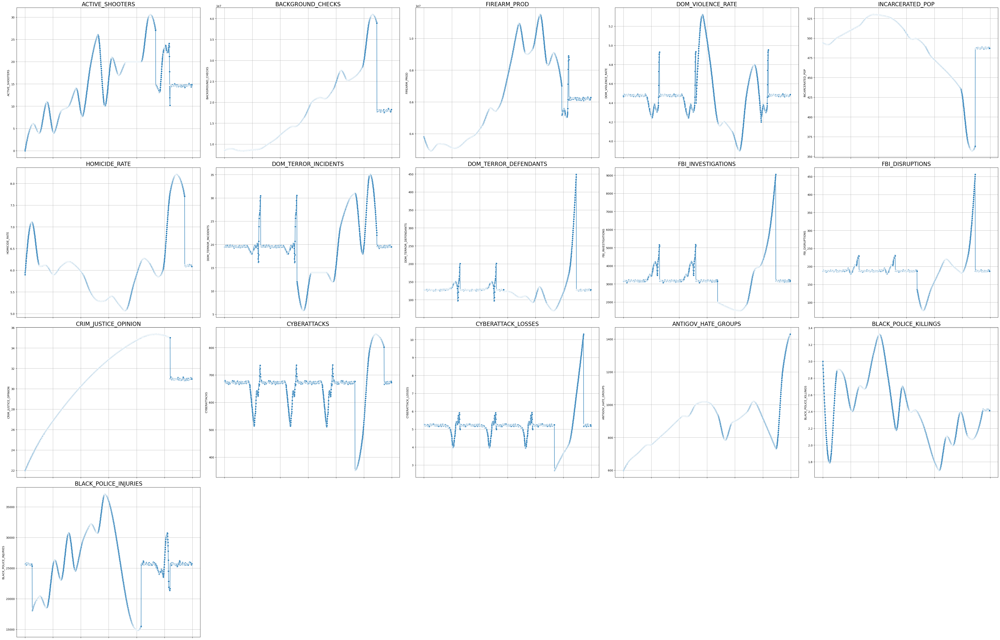

In [161]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [162]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT11_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT11_GAN.xlsx


### CLIENT 12

In [163]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT12_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   AGRI_SPENDING         FARMS  AGRI_SALES
0       2.080000  2.163740e+06  322.200000
1       2.065147  2.163096e+06  322.490353
2       2.050398  2.162458e+06  322.771126
3       2.035752  2.161826e+06  323.042470
4       2.021211  2.161201e+06  323.304534


In [164]:
# Print how many missing values are still in the data
print(df.isnull().sum())

AGRI_SPENDING    104
FARMS            260
AGRI_SALES         0
dtype: int64


In [165]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [166]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [167]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 1.0000853538513184
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


In [168]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


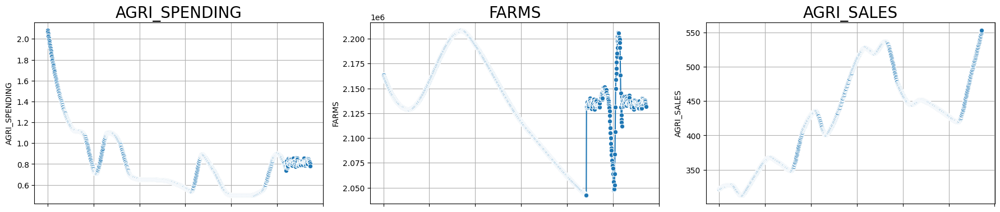

In [170]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(30, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [171]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT12_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT12_GAN.xlsx


In [172]:
# End of code 3/1/25